<a href="https://colab.research.google.com/github/farahwanas/2D-space-invaders/blob/main/Assignment_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing Images

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import urllib.request



In [ ]:
url= "https://www.ipadwallpaper.org/wp-content/uploads/2021/02/Tiger-looking-at-camera-iPad-wallpaper.jpg"
urllib.request.urlretrieve(url, "image1.png")
img1 = Image.open("image1.png")
# Convert the image to a 2D array
img1_array = np.array(img1)

In [ ]:
url = "https://i.stack.imgur.com/UYYqo.jpg"
urllib.request.urlretrieve(url, "image2.png")
img2 = Image.open("image2.png")
# Convert the image to a 2D array
img2_array = np.array(img2)

In [ ]:
url= "https://www.ipadwallpaper.org/wp-content/uploads/2021/05/Dark-moon-crescent-luna-space-iPad-wallpaper.jpg"
urllib.request.urlretrieve(url, "image3.png")
img3 = Image.open("image3.png")
# Convert the image to a 2D array
img3_array = np.array(img3)

# Images

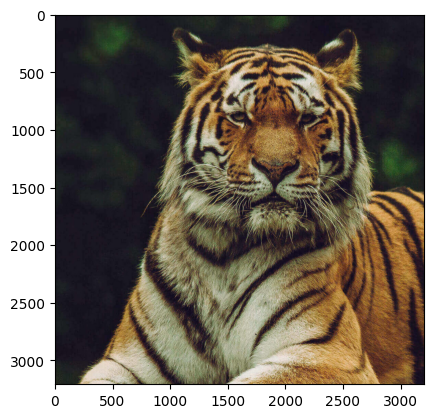

In [ ]:
plt.imshow(img1)

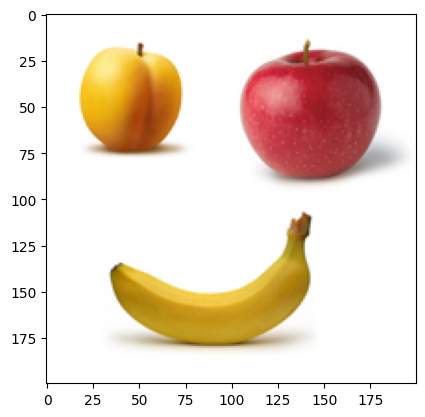

In [ ]:
plt.imshow(img2)

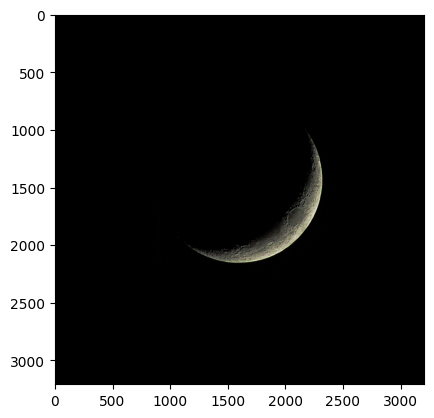

In [ ]:
plt.imshow(img3)




# Split Requirement


Split

In this part, you are asked to perform the split algorithm shown in
class.

The expected output of this step is a quad-tree where each
node represents a segment.

The homogeneousness definition here is
that the difference between maximum and minimum brightness within
it is less than an input parameter.



# Merge Requirement

Merge

In this part, you are asked to perform the Merge algorithm shown in
class.

The expected output of this step is an image where each segment post merging is colored in the mean average of the pixels
forming it.

The homogeneousness definition here is exactly the same as the split step.

Regions merging conflicts are solved in a first come first serve way, as regions merging is performed right away without
considering conflict cases.

# **New and Final Code (To Be Checked)**

# Split

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def is_homogeneous(segment, threshold):
    # Check homogeneity across all channels
    return all(np.max(segment[:, :, i]) - np.min(segment[:, :, i]) < threshold for i in range(3))

def split(image, threshold, x=0, y=0, initial_call=True):
    # Split the image into homogeneous segments
    h, w, _ = image.shape
    if h <= 1 or w <= 1 or is_homogeneous(image, threshold):
        # Return a list of dictionaries with segment info
        return [{'segment': image, 'x': x, 'y': y, 'width': w, 'height': h}]

    mid_h, mid_w = h // 2, w // 2
    segments = []
    for dy in [0, mid_h]:
        for dx in [0, mid_w]:
            segment = image[dy:dy + mid_h, dx:dx + mid_w]
            if segment.size > 0:  # Check if the segment is non-empty
                segments.extend(split(segment, threshold, x=x+dx, y=y+dy, initial_call=False))

    if initial_call:
        # Filter out empty segments
        segments = [seg for seg in segments if seg['segment'].size > 0]

    return segments


def draw_borders(img, segments):
    # Draw borders around each segment and convert the image to RGB format.
    bordered_img = img.copy()
    for segment in segments:
        x, y, w, h = segment['x'], segment['y'], segment['width'], segment['height']
        # Draw a rectangle around each segment in BGR format
        cv2.rectangle(bordered_img, (x, y), (x + w, y + h), (0, 255, 0), 1)  # Green borders in BGR

    # Convert the entire bordered image from BGR to RGB before displaying
    bordered_img_rgb = cv2.cvtColor(bordered_img, cv2.COLOR_BGR2RGB)

    return bordered_img_rgb



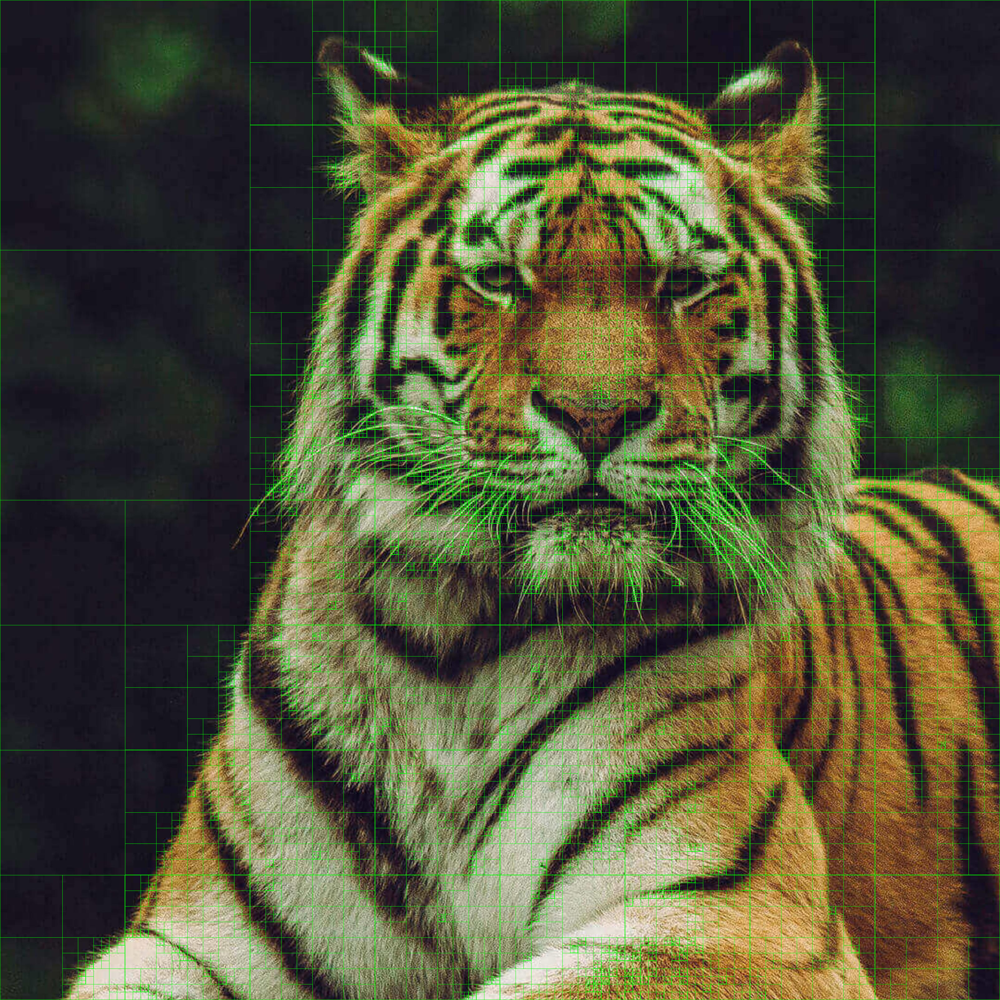

In [ ]:
threshold = 200  # adjust this threshold as needed
split_segments1 = split(img1_array, threshold)

# Draw borders around each segment to visualize the quad-tree
bordered_image1 = draw_borders(img1_array, split_segments1)

# Displaying the result
cv2_imshow(bordered_image1)

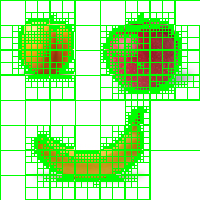

In [ ]:
threshold = 50
split_segments2 = split(img2_array, threshold)

bordered_image2 = draw_borders(img2_array, split_segments2)

cv2_imshow(bordered_image2)

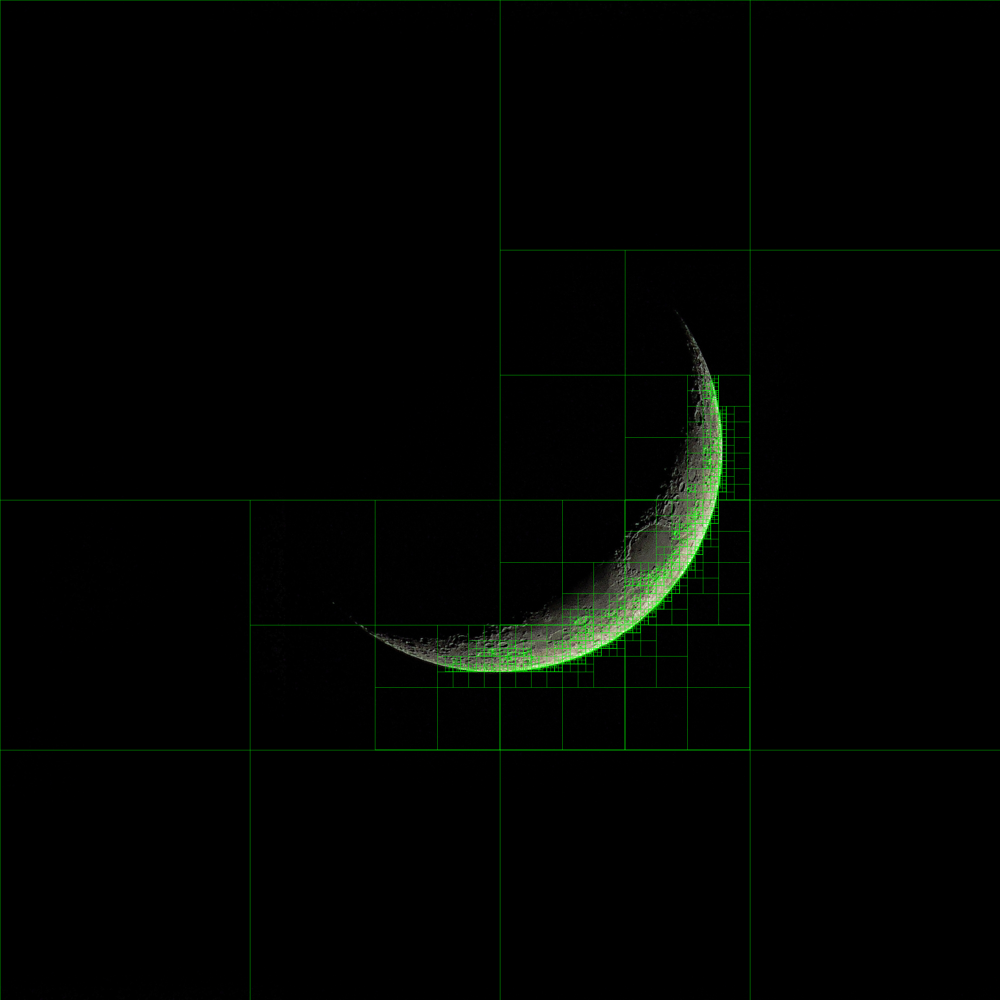

In [ ]:
threshold = 200
split_segments3 = split(img3_array, threshold)

bordered_image3 = draw_borders(img3_array, split_segments3)

cv2_imshow(bordered_image3)

# Merge

In [ ]:
def merge_segments(image, segments):
    # Color each segment with the mean color of the pixels in that segment.
    # The input image is in BGR format
    merged_image = image.copy()
    for segment in segments:
        # Extract the segment
        x, y, w, h = segment['x'], segment['y'], segment['width'], segment['height']
        segment_img = segment['segment']

        # Calculate the mean color of the segment in BGR format
        mean_color_bgr = segment_img.mean(axis=(0, 1)).astype(np.uint8)

        # Color the region with the mean color in BGR
        merged_image[y:y+h, x:x+w] = mean_color_bgr

    # Convert the entire merged image from BGR to RGB before displaying
    merged_image_rgb = cv2.cvtColor(merged_image, cv2.COLOR_BGR2RGB)

    return merged_image_rgb


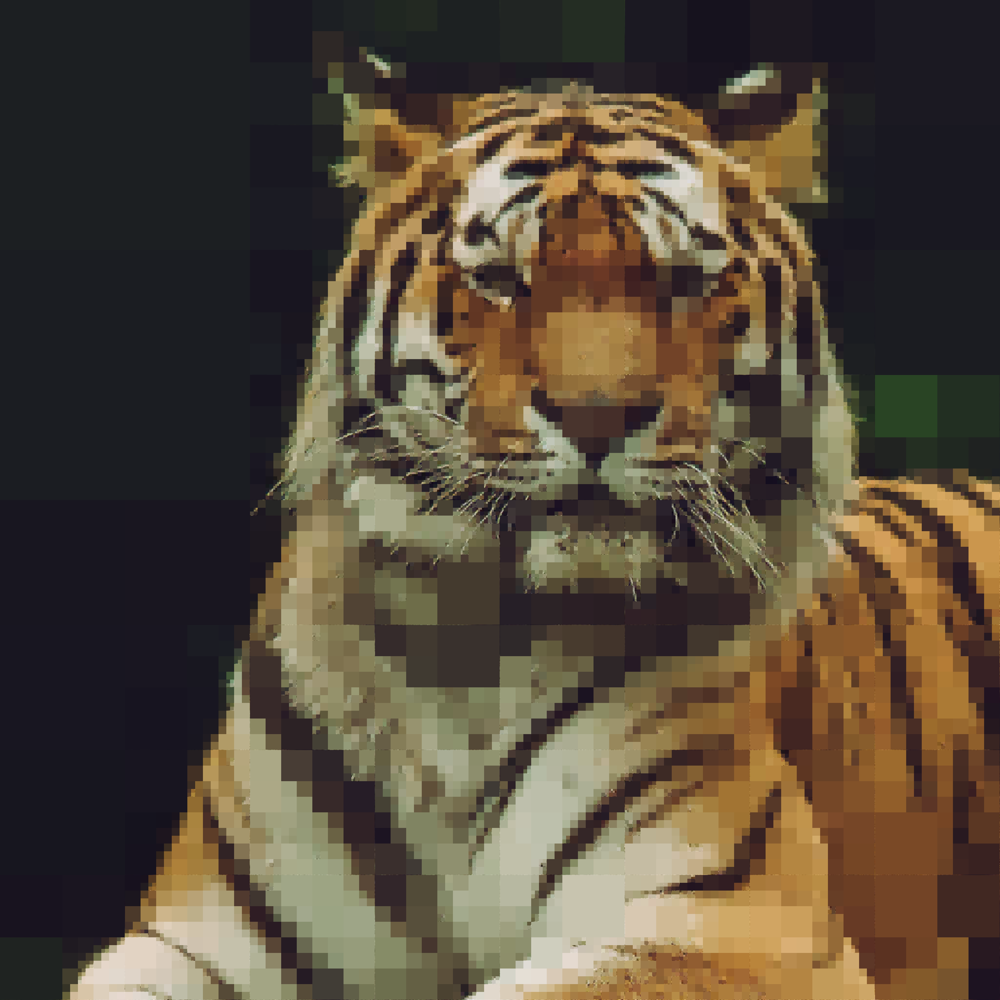

In [ ]:
# Assuming img1_array is your original image in BGR format and split_segments is the list of segments obtained from the split function
merged_image1_rgb = merge_segments(img1_array, split_segments1)

# Displaying the result
cv2_imshow(merged_image1_rgb)  # If you're in a Jupyter notebook, you might use plt.imshow(merged_image_rgb) instead


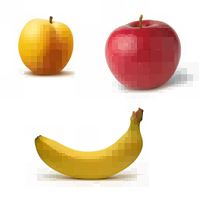

In [ ]:
# Assuming img1_array is your original image in BGR format and split_segments is the list of segments obtained from the split function
merged_image2_rgb = merge_segments(img2_array, split_segments2)
# Display the result using cv2_imshow in Colab or use plt.imshow if not in Colab
cv2_imshow(merged_image2_rgb)


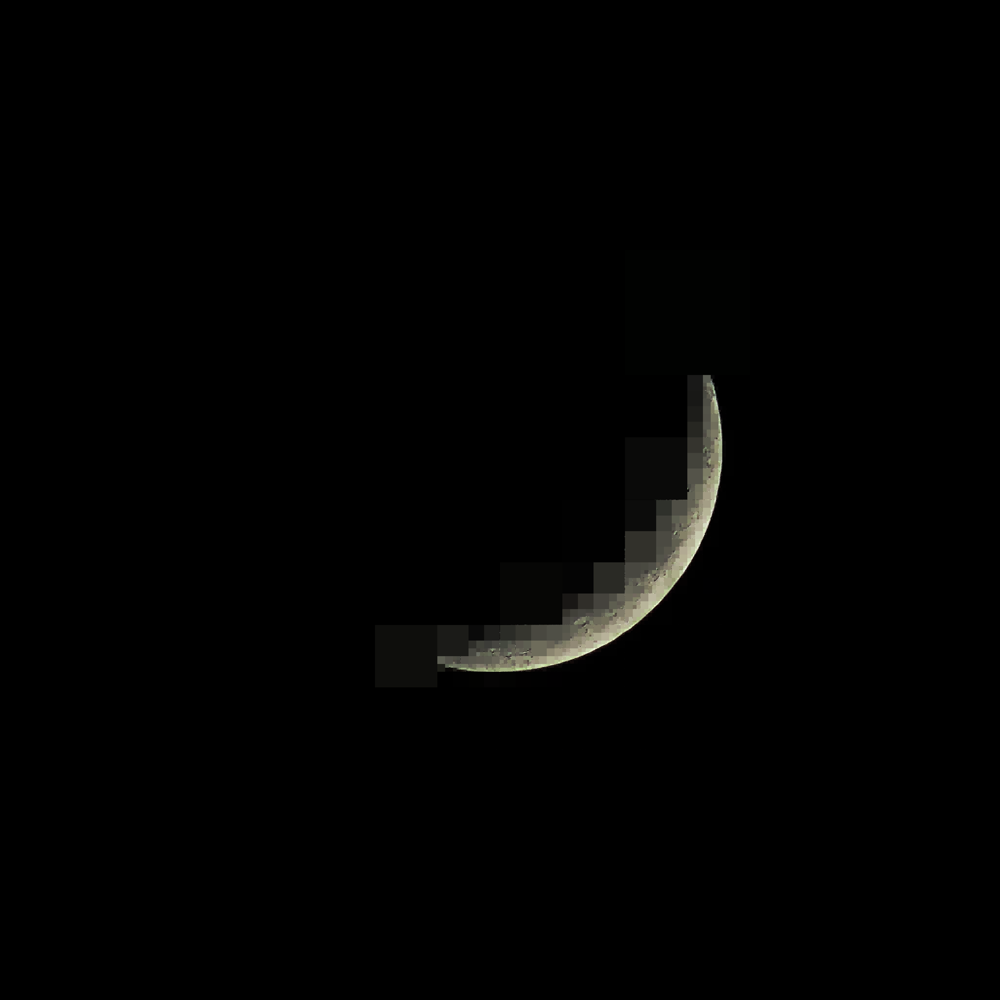

In [ ]:
merged_image3_rgb = merge_segments(img3_array, split_segments3)

cv2_imshow(merged_image3_rgb)

# **Old Code - For reference (No Need to check - Ignore)**

Helper Methods

Old Split

New + Used Split

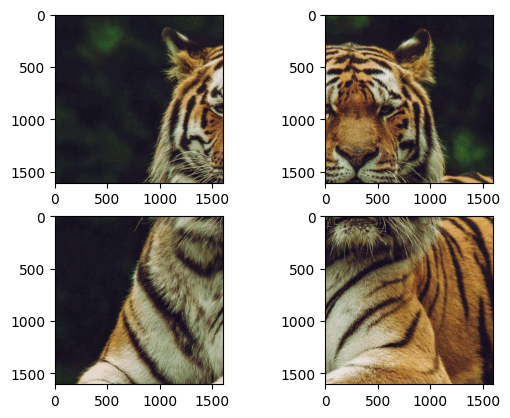

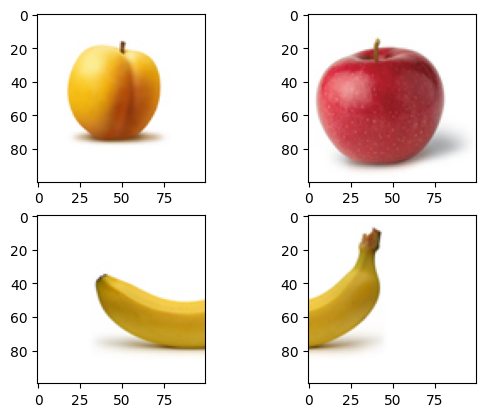

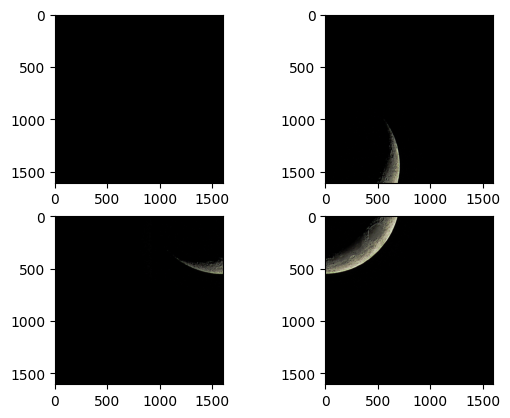

In [ ]:
from operator import add
from functools import reduce

def split4(image):
    img_array = np.array(image)
    half_split = np.array_split(img_array, 2)
    res = map(lambda x: np.array_split(x, 2, axis=1), half_split)
    return reduce(add, res)


# lambda x: np.array_split(x, 2, axis=1): This is an anonymous lambda function that takes an argument x and applies the np.array_split function to split x into two parts along the second axis (columns). The axis=1 parameter specifies that the split should be done along columns.

# map(lambda x: np.array_split(x, 2, axis=1), half_split): The map function applies the lambda function to each element in the half_split iterable. In this case, half_split is assumed to be a list of arrays, and the lambda function is applied to each array in the list.

# res: The result is a map object containing the split arrays. If you want to convert it to a list, you can do res = list(map(lambda x: np.array_split(x, 2, axis=1), half_split)).




# Split  Image 1
split_images = split4(img1)
# Create a 2x2 subplot and display the images
plt.subplot(2, 2, 1)
plt.imshow(split_images[0])
plt.subplot(2, 2, 2)
plt.imshow(split_images[1])
plt.subplot(2, 2, 3)
plt.imshow(split_images[2])
plt.subplot(2, 2, 4)
plt.imshow(split_images[3])
# Show the plot
plt.show()


# Split Image 2
split_images = split4(img2)
# Create a 2x2 subplot and display the images
plt.subplot(2, 2, 1)
plt.imshow(split_images[0])
plt.subplot(2, 2, 2)
plt.imshow(split_images[1])
plt.subplot(2, 2, 3)
plt.imshow(split_images[2])
plt.subplot(2, 2, 4)
plt.imshow(split_images[3])
# Show the plot
plt.show()


# Split Image 3
split_images = split4(img3)
# Create a 2x2 subplot and display the images
plt.subplot(2, 2, 1)
plt.imshow(split_images[0])
plt.subplot(2, 2, 2)
plt.imshow(split_images[1])
plt.subplot(2, 2, 3)
plt.imshow(split_images[2])
plt.subplot(2, 2, 4)
plt.imshow(split_images[3])
# Show the plot
plt.show()

Homogenity Condition

In [ ]:
def split_condition(img, threshold):
    img_array = np.array(img)

    if img_array.size == 0:
        return False  # Return False for empty arrays

    max_value = np.max(img_array)
    min_value = np.min(img_array)


    split_condition = (max_value - min_value) >= threshold
    return split_condition


Split

In [ ]:
class QuadTree:

    #Initialization of the tree
    def __init__(self):
        self.level = 0
        self.split = False
        self.resolution = (0, 0)
        self.final = True
        self.north_west = None
        self.north_east = None
        self.south_west = None
        self.south_east = None


    def insert(self, img, threshold, level=0):
        self.level = level
        self.split = split_condition(img, threshold)
        img_array = np.array(img)
        self.resolution = (img_array.shape[0], img_array.shape[1])
        self.final = True

        if self.split:
            split_img = split4(img)
            self.final = False
            self.north_west = QuadTree().insert(split_img[0], threshold, level + 1)
            self.north_east = QuadTree().insert(split_img[1], threshold, level + 1)
            self.south_west = QuadTree().insert(split_img[2], threshold, level + 1)
            self.south_east = QuadTree().insert(split_img[3], threshold, level + 1)
        return self


    #The __repr__ method will print information about each level of the QuadTree,
    def __repr__(self):
        result = f"Level: {self.level}, Split: {self.split}, Resolution: {self.resolution}, Final: {self.final}\n"
        if not self.final:
            result += f"North-West:\n{repr(self.north_west)}\n"
            result += f"North-East:\n{repr(self.north_east)}\n"
            result += f"South-West:\n{repr(self.south_west)}\n"
            result += f"South-East:\n{repr(self.south_east)}\n"
        return result



Printing

In [ ]:
pip install PrettyPrintTree

In [ ]:
class QuadTree:
    # Initialization of the tree
    def __init__(self):
        self.level = 0
        self.split = False
        self.resolution = (0, 0)
        self.final = True
        self.children = []
        self.val = 4

    def insert(self, img, threshold, level=0):
        self.level = level
        self.split = split_condition(img, threshold)
        img_array = np.array(img)
        self.resolution = (img_array.shape[0], img_array.shape[1])
        self.final = True
        self.val = img
                  #  "Level: ", level, "\n", \
                  #  "Min: ", np.min(img_array), "\n", \
                  #  "Max: ",np.max(img_array) , "\n", \
                  #  "Split: ", self.split, "\n", \
                  #  "Threshold: " , threshold

        if self.split:
            split_img = split4(img)
            self.final = False
            self.children.append(QuadTree().insert(split_img[0], threshold, level + 1))
            self.children.append(QuadTree().insert(split_img[1], threshold, level + 1))
            self.children.append(QuadTree().insert(split_img[2], threshold, level + 1))
            self.children.append(QuadTree().insert(split_img[3], threshold, level + 1))
        return self

In [ ]:
from PrettyPrint import PrettyPrintTree

pt = PrettyPrintTree(lambda x: x.children, lambda x: x.val)
quadtree = QuadTree().insert(img1, threshold=250)
pt(quadtree)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
# Example usage:
quadtree = QuadTree().insert(img1, threshold=230)
print(quadtree)

In [ ]:
# Example usage:
quadtree = QuadTree().insert(img2, threshold=240)
print(quadtree)

In [ ]:
# Example usage:
quadtree = QuadTree().insert(img3, threshold=200)
print(quadtree)

Merge

In [ ]:
def concatenate4(north_west, north_east, south_west, south_east):
    top = np.concatenate((north_west, north_east), axis=1)
    bottom = np.concatenate((south_west, south_east), axis=1)
    return np.concatenate((top, bottom), axis=0)

In [ ]:
class QuadTreeMerge:
    def insert(self, img, threshold, level = 0):
        self.level = level
        self.split = split_condition(img,threshold)
        img_array = np.array(img)
        self.resolution = (img_array.shape[0], img_array.shape[1])
        self.final = True

        if self.split:
            split_img = split4(img)
            self.final = False
            self.north_west = QuadTreeMerge().insert(split_img[0], threshold,level + 1)
            self.north_east = QuadTreeMerge().insert(split_img[1], threshold,level + 1)
            self.south_west = QuadTreeMerge().insert(split_img[2], threshold,level + 1)
            self.south_east = QuadTreeMerge().insert(split_img[3], threshold,level + 1)
        return self

    def get_image(self, level):
        if(self.final or self.level == level):
            return np.tile(self.split, (self.resolution[0], self.resolution[1], 1))

        return concatenate4(
            self.north_west.get_image(level),
            self.north_east.get_image(level),
            self.south_west.get_image(level),
            self.south_east.get_image(level))





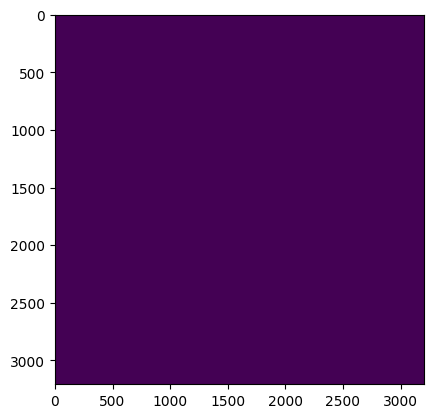

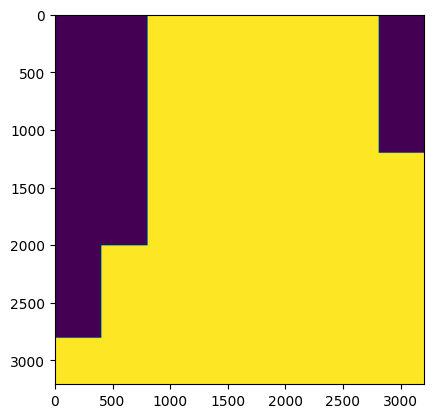

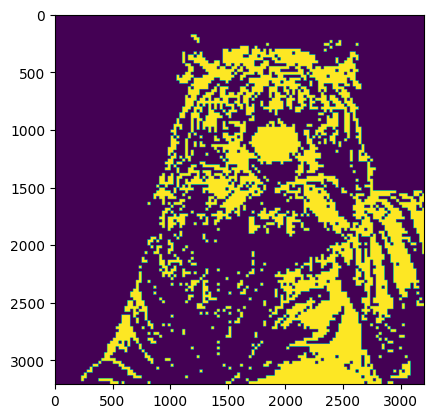

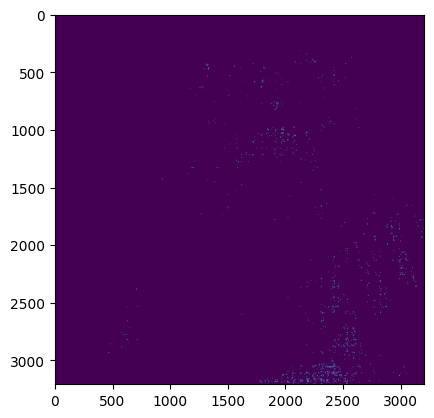

In [ ]:
quadTreeMerge = QuadTreeMerge().insert(img1, 200)
plt.imshow(quadTreeMerge.get_image(1))
plt.show()
plt.imshow(quadTreeMerge.get_image(3))
plt.show()
plt.imshow(quadTreeMerge.get_image(7))
plt.show()
plt.imshow(quadTreeMerge.get_image(10))
plt.show()

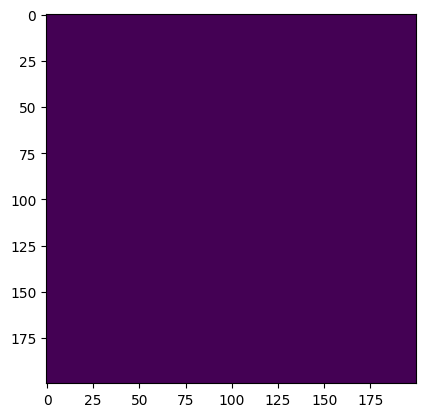

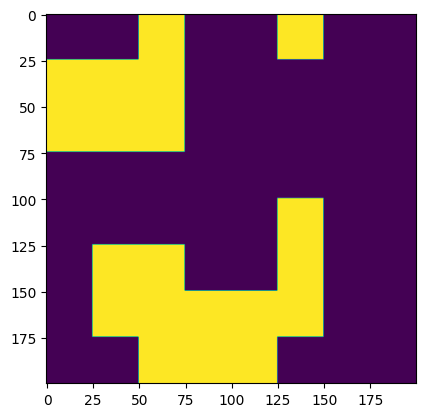

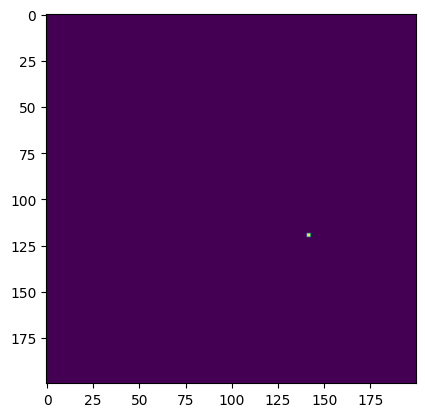

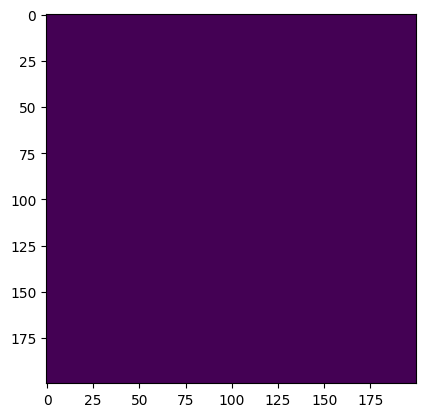

In [ ]:
quadTreeMerge = QuadTreeMerge().insert(img2, 235)
plt.imshow(quadTreeMerge.get_image(1))
plt.show()
plt.imshow(quadTreeMerge.get_image(3))
plt.show()
plt.imshow(quadTreeMerge.get_image(7))
plt.show()
plt.imshow(quadTreeMerge.get_image(10))
plt.show()

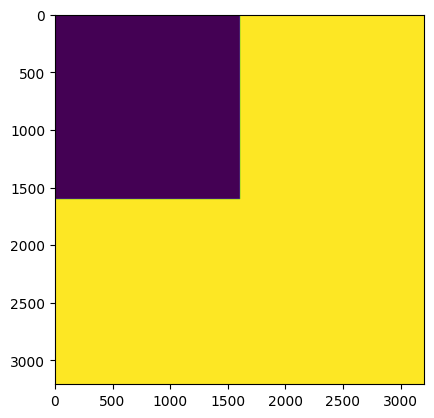

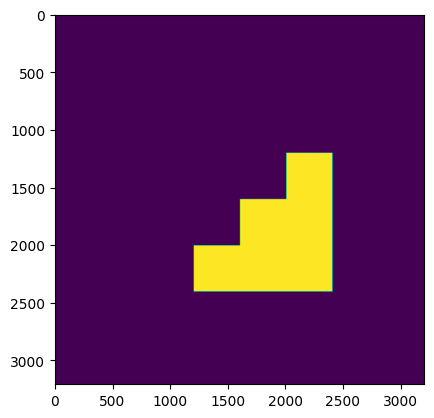

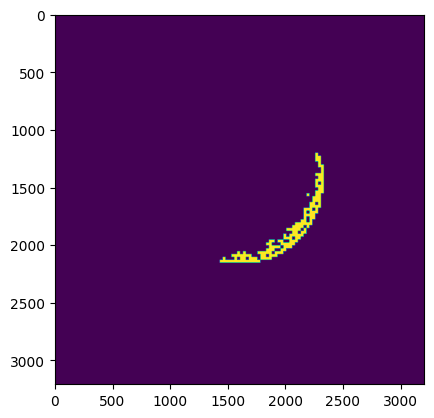

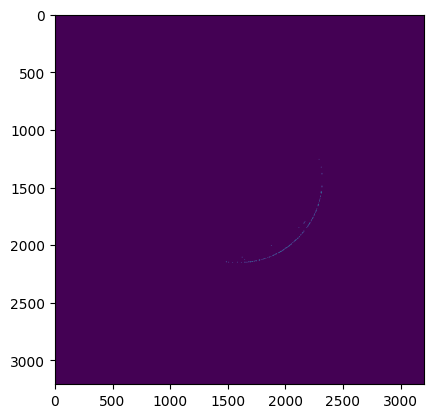

In [ ]:
quadTreeMerge = QuadTreeMerge().insert(img3, 200)
plt.imshow(quadTreeMerge.get_image(1))
plt.show()
plt.imshow(quadTreeMerge.get_image(3))
plt.show()
plt.imshow(quadTreeMerge.get_image(7))
plt.show()
plt.imshow(quadTreeMerge.get_image(10))
plt.show()